In [66]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## 1. Load Data

### 1.1 Load train and test data

the dataset is splitted into 4 files. Files 1 & 3 (dataset 1) contain a different turbine setting than files 2 & 4 (dataset 2). In this project the datasets will be treated seperately and seperate models will be trained.

In [67]:
# load train data
PATH = './full_data/'
FILES = [2, 4] # define which dataset to load
LABEL = 2 # define how many labels (urgency classes) as target classes to be used

df_train = pd.DataFrame()
df_test = pd.DataFrame()
# load the defined 2 training data files into a dataframe
for file_no in FILES:
    file_train = 'train_FD00' + str(file_no) + '.txt'
    file_test = 'test_FD00' + str(file_no) + '.txt'
    df_Tr = pd.read_csv(PATH + file_train, sep=' ', header=None)
    df_te = pd.read_csv(PATH + file_test, sep=' ', header=None)
    # add a x 1000 to the id [0] == ID (else ids are not unique: e.g. in each file exists ID 1)
    df_Tr[0] = df_Tr[0] + file_no * 1000
    df_te[0] = df_te[0] + file_no * 1000
    # concattenate the new dataframe to the others
    df_train = pd.concat([df_train, df_Tr])
    df_test = pd.concat([df_test, df_te])

# drop the last 2 whitespaces (empty)
df_train.drop(columns=[26, 27], inplace=True)
df_test.drop(columns=[26, 27], inplace=True)

# rename the columns
column_names = ['id', 'cycle', 'setting1', 'setting2', 'setting3', 's1', 's2', 's3',
                    's4', 's5', 's6', 's7', 's8', 's9', 's10', 's11', 's12', 's13', 's14',
                    's15', 's16', 's17', 's18', 's19', 's20', 's21']
df_train.columns = column_names
df_test.columns = column_names
# reset the index
df_train.reset_index(inplace=True, drop=True)
df_test.reset_index(inplace=True, drop=True)
df_test.head(5)

,id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,s12,s13,s14,s15,s16,s17,s18,s19,s20,s21
0,2001,1,9.9987,0.2502,100.0,489.05,605.03,1497.17,1304.99,10.52,...,371.69,2388.18,8114.10,8.6476,0.03,369,2319,100.00,28.42,17.1551
1,2001,2,20.0026,0.7000,100.0,491.19,607.82,1481.20,1246.11,9.35,...,315.32,2388.12,8053.06,9.2405,0.02,364,2324,100.00,24.29,14.8039
2,2001,3,35.0045,0.8400,100.0,449.44,556.00,1359.08,1128.36,5.48,...,183.04,2387.75,8053.04,9.3472,0.02,333,2223,100.00,14.98,8.9125
3,2001,4,42.0066,0.8410,100.0,445.00,550.17,1349.69,1127.89,3.91,...,130.40,2387.72,8066.90,9.3961,0.02,332,2212,100.00,10.35,6.4181
4,2001,5,24.9985,0.6213,60.0,462.54,536.72,1253.18,1050.69,7.05,...,164.56,2028.05,7865.66,10.8682,0.02,305,1915,84.93,14.31,8.5740


In [68]:
# check for NaN
print(f"Train isna: {df_train.isna().sum().sum()} Test isna: {df_test.isna().sum().sum()}")

Train isna: 0 Test isna: 0


### 1.2 Load remaining usefull life (RUL) data for the test dataset

while in the training sets all engine simulations end with a failure (RUL = 0) in the test dataset the engine simulation end at a 
random RUL. These RUL are defined in the RUL-files. The RUL will get added to the test files.

In [69]:
# load the RUL-files of the dataset
for file_no in FILES:
    # load the file
    file_rul = 'RUL_FD00' + str(file_no) + '.txt'
    df_remain = pd.read_csv(PATH + file_rul, sep= ' ', header=None)
    # add the ID to the each line
    df_remain['id'] = df_remain.index + 1
    df_remain['id'] = df_remain['id'] + file_no * 1000
    # drop column 1 (Nan due to whitespace)
    df_remain.drop(columns=[1], inplace=True)
    # rename columns
    df_remain.columns = ['rul', 'id']
    # define df_remain with the 1st file
    if FILES.index(file_no) == 0:
        df_rul = df_remain
    else:
        # concattenate the new dataframe to the others
        df_rul = pd.concat([df_rul, df_remain])

df_rul.reset_index(inplace=True, drop=True)
df_rul.head(5)

,rul,id
0,18,2001
1,79,2002
2,106,2003
3,110,2004
4,15,2005


In [70]:
print(df_train.shape, df_test.shape, df_rul.shape)
df_test['id'].nunique()

(115008, 26) (75205, 26) (507, 2)


507

## 2. Data labelling (classification model)

### 2.1 Add RUL to train data 

train data assumption: RUL = 0 at the end of the total sequence (as it ends with a engine failure)

In [71]:
# add the RUL to each datapoint (last timestep -> RUL == 0)
rul_train = pd.DataFrame(df_train.groupby('id')['cycle'].max()).reset_index()
rul_train.columns = ['id', 'max']
df_train = df_train.merge(rul_train, how='left', on='id')
df_train['rul'] = df_train['max'] - df_train['cycle']
df_train.drop(columns='max', inplace=True)
df_train.head(5)

,id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,s13,s14,s15,s16,s17,s18,s19,s20,s21,rul
0,2001,1,34.9983,0.8400,100.0,449.44,555.32,1358.61,1137.23,5.48,...,2387.72,8048.56,9.3461,0.02,334,2223,100.00,14.73,8.8071,148
1,2001,2,41.9982,0.8408,100.0,445.00,549.90,1353.22,1125.78,3.91,...,2387.66,8072.30,9.3774,0.02,330,2212,100.00,10.41,6.2665,147
2,2001,3,24.9988,0.6218,60.0,462.54,537.31,1256.76,1047.45,7.05,...,2028.03,7864.87,10.8941,0.02,309,1915,84.93,14.08,8.6723,146
3,2001,4,42.0077,0.8416,100.0,445.00,549.51,1354.03,1126.38,3.91,...,2387.61,8068.66,9.3528,0.02,329,2212,100.00,10.59,6.4701,145
4,2001,5,25.0005,0.6203,60.0,462.54,537.07,1257.71,1047.93,7.05,...,2028.00,7861.23,10.8963,0.02,309,1915,84.93,14.13,8.5286,144


### 2.2 Add label to train data

3 classes: 
RUL > 30 --> class 0 (no alert) //
RUL <= 30 --> class 1 (normal alert) //
RUL <= 15 --> class 2 (urgent alert)

In [72]:
if LABEL == 2:
    # defining 2 error periods (w1: normal alert, w2: urgent alert)
    w2, w1 = 15, 30
    df_train['label'] = 0
    df_train['label'].loc[df_train['rul'] <= w1] = 1 
    df_train['label'].loc[df_train['rul'] <= w2] = 2 
    df_train['label'].value_counts()

/tmp/ipykernel_8326/3988482685.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train['label'].loc[df_train['rul'] <= w1] = 1
/tmp/ipykernel_8326/3988482685.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train['label'].loc[df_train['rul'] <= w2] = 2


### 2.3 Add labels to test data

#### 2.3.1 add RUL to test data

In [73]:
# 1. total cycles of an engine = RUL of the engine from RUL dataframe + max cycle of test dataframe
rul_test = pd.DataFrame(df_test.groupby('id')['cycle'].max()).reset_index()
rul_test.columns=['id','max']
df_rul.columns=['more','id']
rul_test = rul_test.merge(df_rul, how='left', on='id')
rul_test['tot'] = rul_test['max'] + rul_test['more']
rul_test.drop(columns=['max','more'], inplace=True)
df_test = df_test.merge(rul_test, how='left', on='id')
# calculate the RUL for each datapoint
df_test['rul'] = df_test['tot'] - df_test['cycle']
df_test.drop(columns='tot', inplace=True)
df_test.head(5)

,id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,s13,s14,s15,s16,s17,s18,s19,s20,s21,rul
0,2001,1,9.9987,0.2502,100.0,489.05,605.03,1497.17,1304.99,10.52,...,2388.18,8114.10,8.6476,0.03,369,2319,100.00,28.42,17.1551,275
1,2001,2,20.0026,0.7000,100.0,491.19,607.82,1481.20,1246.11,9.35,...,2388.12,8053.06,9.2405,0.02,364,2324,100.00,24.29,14.8039,274
2,2001,3,35.0045,0.8400,100.0,449.44,556.00,1359.08,1128.36,5.48,...,2387.75,8053.04,9.3472,0.02,333,2223,100.00,14.98,8.9125,273
3,2001,4,42.0066,0.8410,100.0,445.00,550.17,1349.69,1127.89,3.91,...,2387.72,8066.90,9.3961,0.02,332,2212,100.00,10.35,6.4181,272
4,2001,5,24.9985,0.6213,60.0,462.54,536.72,1253.18,1050.69,7.05,...,2028.05,7865.66,10.8682,0.02,305,1915,84.93,14.31,8.5740,271


#### 2.3.2 add labels to test data

In [74]:
if LABEL == 2:
    # clabel the test data
    # defining 2 error periods (w1: normal alert, w2: urgent alert)
    w2, w1 = 15, 30
    df_test['label'] = 0
    df_test['label'].loc[df_test['rul'] <= w1] = 1 
    df_test['label'].loc[df_test['rul'] <= w2] = 2 
    df_test['label'].value_counts()


/tmp/ipykernel_8326/1330564173.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test['label'].loc[df_test['rul'] <= w1] = 1
/tmp/ipykernel_8326/1330564173.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test['label'].loc[df_test['rul'] <= w2] = 2


## 3. Exploratory data analysis 

### 3.1 statistical feature details

In [75]:
features = ['setting1', 'setting2', 'setting3', 's1', 's2', 's3',
       's4', 's5', 's6', 's7', 's8', 's9', 's10', 's11', 's12', 's13', 's14',
       's15', 's16', 's17', 's18', 's19', 's20', 's21']
for feature in features:
    print(df_train[feature].describe())

count    115008.000000
mean         23.999161
std          14.765080
min           0.000000
25%          10.004600
50%          25.001400
75%          41.998000
max          42.008000
Name: setting1, dtype: float64
count    115008.000000
mean          0.571679
std           0.310381
min           0.000000
25%           0.250700
50%           0.700000
75%           0.840000
max           0.842000
Name: setting2, dtype: float64
count    115008.000000
mean         94.038328
std          14.245249
min          60.000000
25%         100.000000
50%         100.000000
75%         100.000000
max         100.000000
Name: setting3, dtype: float64
count    115008.000000
mean        472.895417
std          26.414703
min         445.000000
25%         445.000000
50%         462.540000
75%         491.190000
max         518.670000
Name: s1, dtype: float64
count    115008.000000
mean        579.538010
std          37.317816
min         535.480000
25%         549.440000
50%         555.870000
75%     

### 3.2 plot the features

#### 3.2.1 plot pairplots

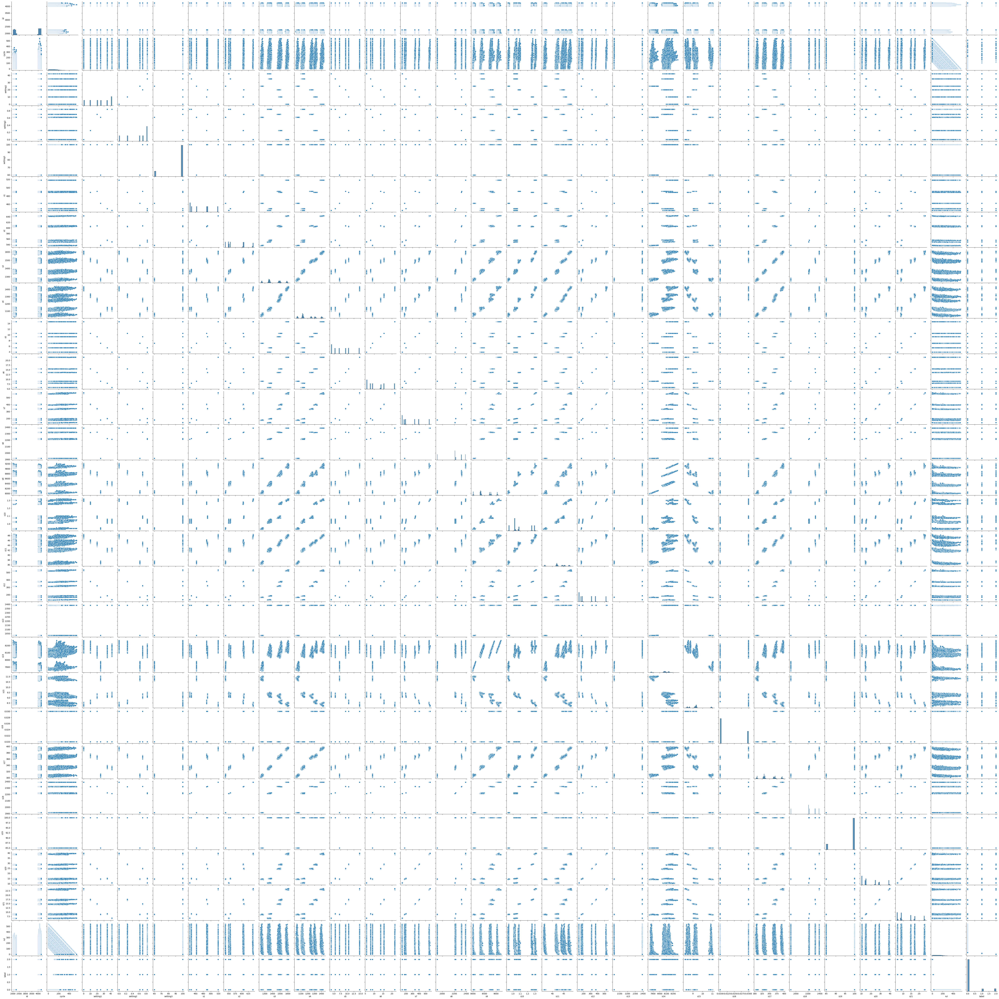

In [76]:
# show pairplot of all features
run_code = False
if run_code:
    sns.pairplot(data=df_train)

#### 3.2.2 plot feature time series

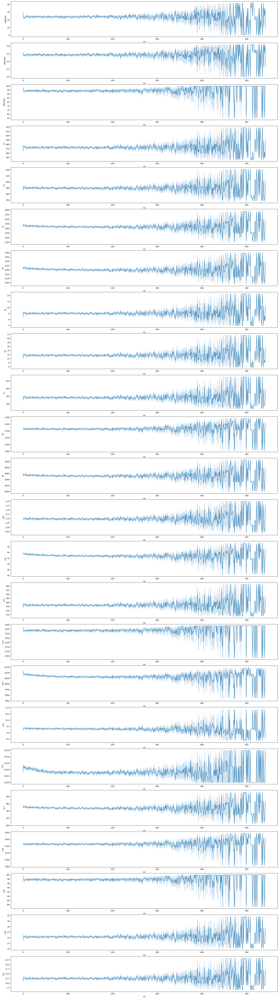

In [80]:
fig, axs = plt.subplots(figsize=(20, len(features) * 3), nrows=len(features), ncols=1)
fig.tight_layout()
for i, feature in enumerate(features):
    sns.lineplot(data=df_train, y=feature, x='rul', ax=axs[i])

### 3.3 feature correlations

#### 3.3.1 plot correlation heatmap

<AxesSubplot: >

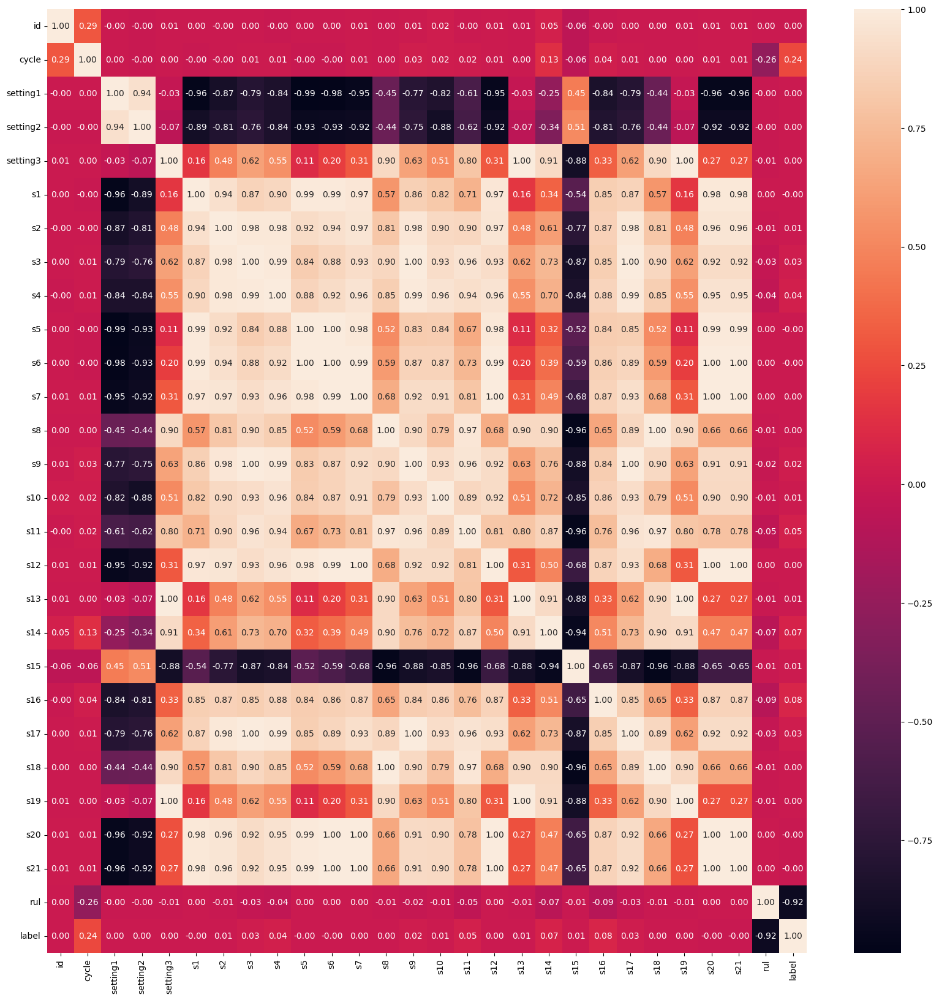

In [14]:
# plot correlations of features when RUL is lower than 60 (60 here defined as detoriation period)
plt.subplots(figsize=(20,20))
sns.heatmap(df_train.loc[df_train['rul'] < 60].corr(),annot=True, fmt='.2f')

#### 3.3.2 delete unused and highly correlated features

In [15]:
# for file 1 and 3 without setting 3:
if FILES == [1, 3]:
    # delete unused sensors:
    df_train.drop(columns=['setting3', 's1', 's5', 's16', 's18', 's19'], inplace=True)
    df_test.drop(columns=['setting3', 's1', 's5', 's16', 's18', 's19'], inplace=True)
    # delete highly correlated sensors:
    df_train.drop(columns=['s7', 's8', 's14'], inplace=True)
    df_test.drop(columns=['s7', 's8', 's14'], inplace=True)
# for file 2 and 4 with setting 3:
elif FILES == [2, 4]:
    df_train.drop(columns=['s1', 's2', 's3', 's5', 's7', 's8', 's9', 's12', 's13','s18', 's19', 's20', 's21'], inplace=True)
    df_test.drop(columns=['s1', 's2', 's3', 's5', 's7', 's8', 's9', 's12', 's13','s18', 's19', 's20', 's21'], inplace=True)

<AxesSubplot: >

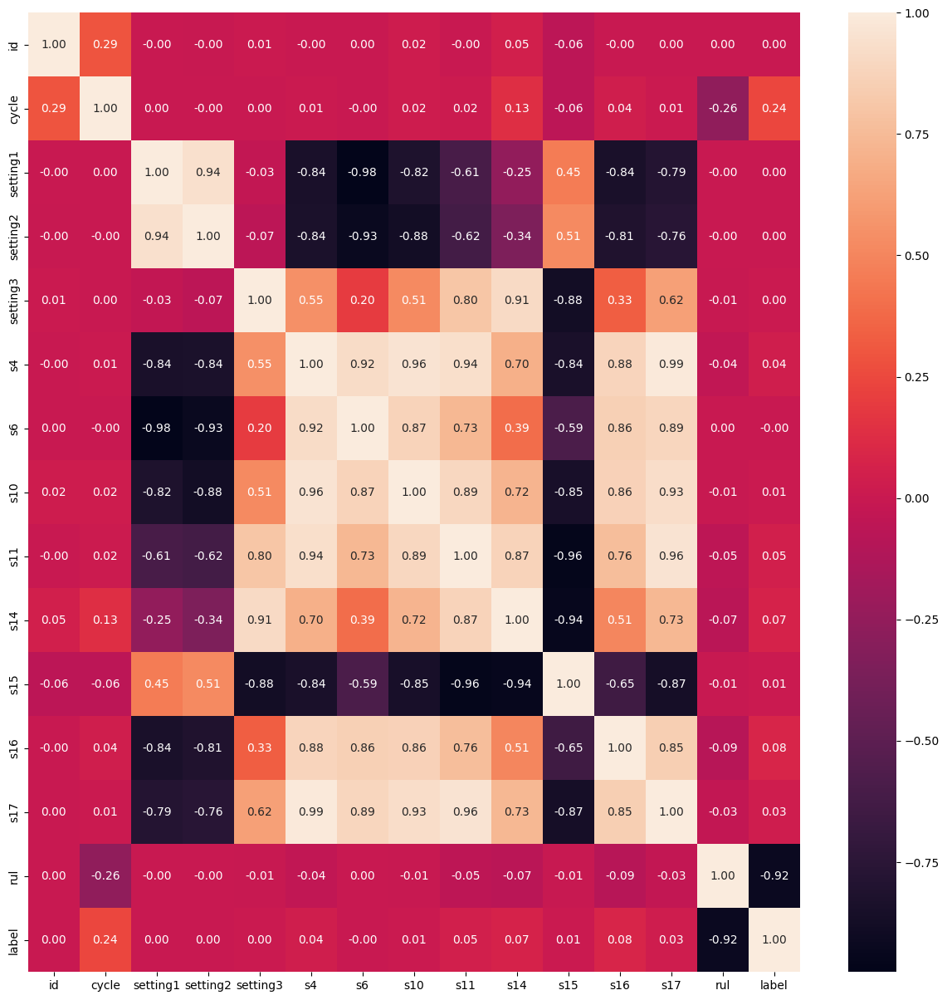

In [16]:
# draw the correlations heatmap again
plt.subplots(figsize=(15,15))
sns.heatmap(df_train.loc[df_train['rul'] < 60].corr(),annot=True, fmt='.2f')

## 4. Save Train and Test data

In [97]:
run_code = True
if run_code:
    if FILES == [1, 3]:
        if LABEL == 3:
            # save the files
            df_train.to_csv('./reworked_data/train_cat_set1_3L.csv')
            df_test.to_csv('./reworked_data/test_cat_set1_3L.csv')
        # save the files
        if LABEL == 2:
            df_train.to_csv('./reworked_data/train_cat_set1.csv')
            df_test.to_csv('./reworked_data/test_cat_set1.csv')
    elif FILES == [2, 4]:
        if LABEL == 3:
            df_train.to_csv('./reworked_data/train_cat_set3_3L.csv')
            df_test.to_csv('./reworked_data/test_cat_set3_3L.csv')  
        if LABEL == 2:
            df_train.to_csv('./reworked_data/train_cat_set3.csv')
            df_test.to_csv('./reworked_data/test_cat_set3.csv')        

## 5. Plot the features 

### 5.1 plot the RUL for Train and Test data

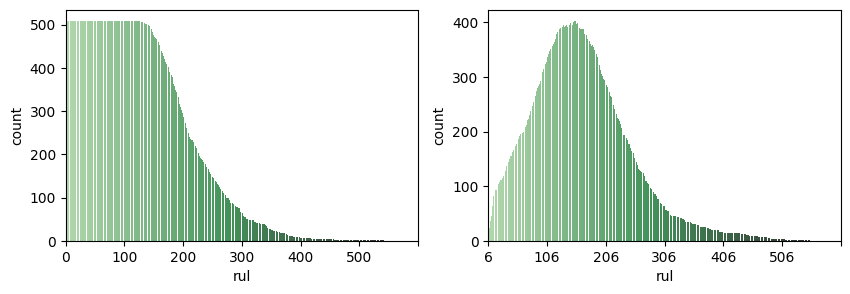

In [24]:
# plot the y data for train and test
run_code = True
if run_code:
    fig, axs= plt.subplots(figsize=(10,3), nrows=1, ncols=2)
    for i, df_plot in enumerate([df_train, df_test]):
        sns.countplot(x="rul", data=df_plot, palette="Greens_d", ax=axs[i])
        axs[i].set(xlim=(0, 600), xticks=[0, 100, 200, 300, 400, 500, 600])

### 5.2 plot the features for the last RUL cycles 

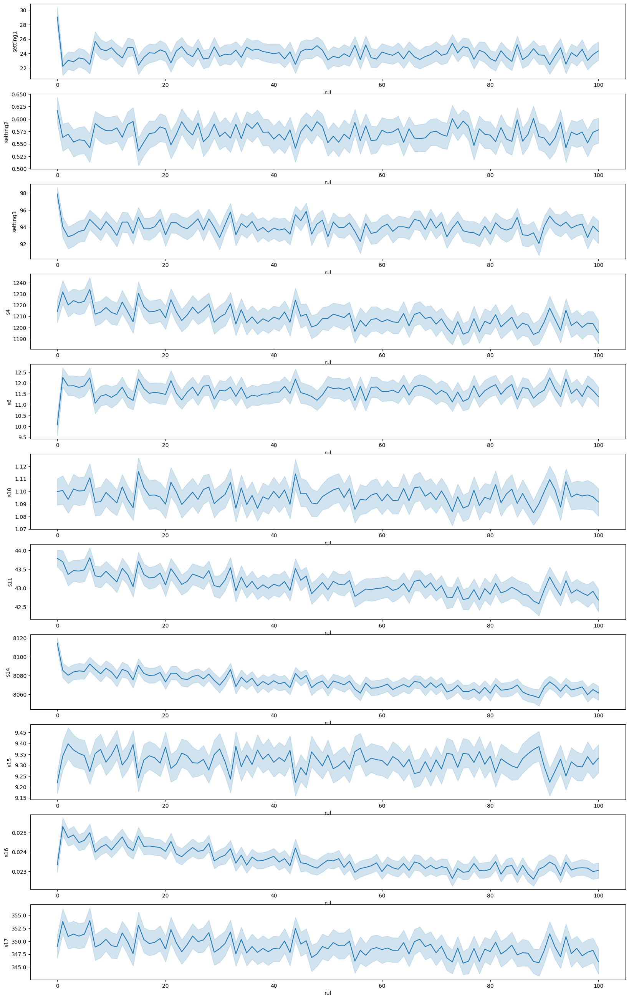

In [49]:
run_code = True
if run_code:
       INFO = ['id', 'cycle', 'rul', 'label']
       FEATURES = df_train.drop(columns=INFO).columns
       # plot the sensors in regards to the RUL (when below threshold value)
       threshold_value = 100
       fig, axs = plt.subplots(figsize=(20, len(FEATURES) * 3), nrows=len(FEATURES), ncols=1)
       df_plot = df_train.loc[df_train['rul'] <= threshold_value]
       for i, feature in enumerate(FEATURES):
              sns.lineplot(data=df_plot, x=df_plot['rul'], y=df_plot[feature], ax=axs[i])

### 5.3 plot the sensors for 1 example engine for the last n cycles

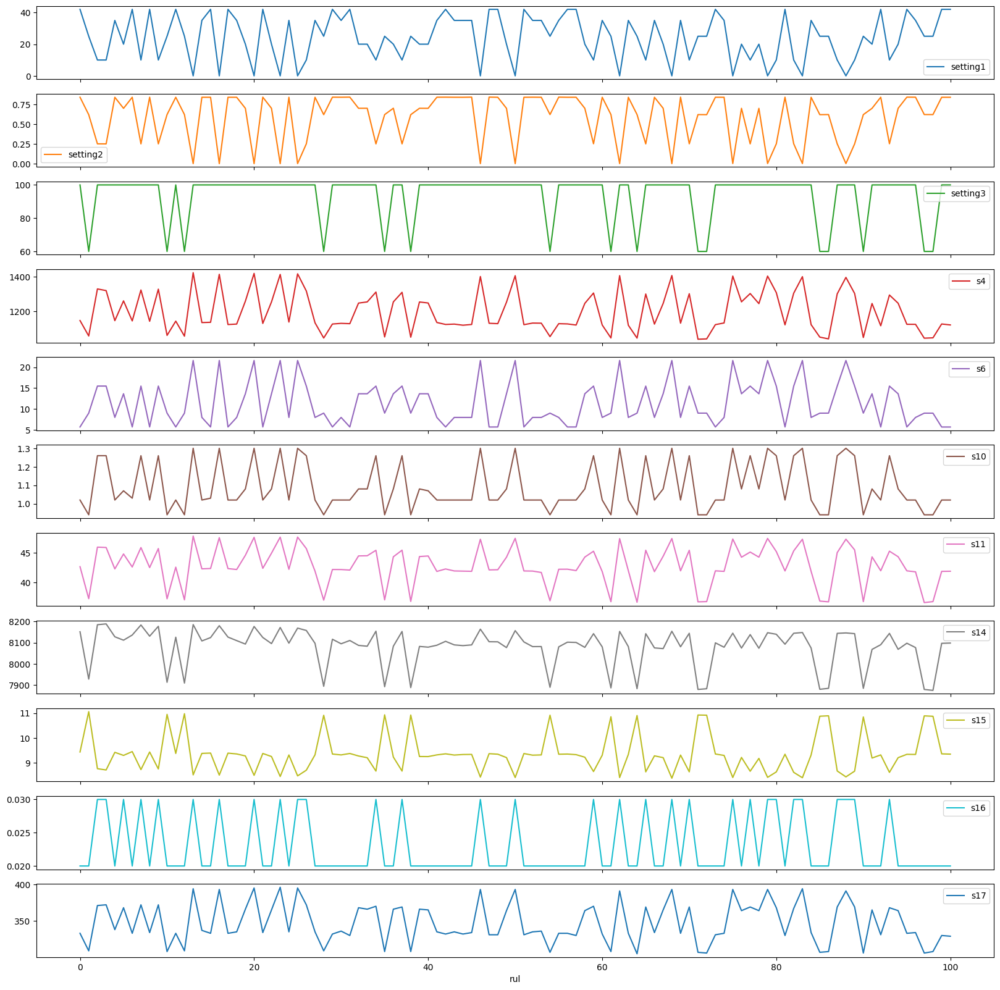

In [63]:
run_plots = True
if run_plots:
    # print sensors for engine 1 60 cycles before failure
    engine_id = 2005
    n = 100
    INFO = ['id', 'cycle', 'label']
    FEATURES = df_train.drop(columns=INFO).columns
    engine = df_train[FEATURES].loc[(df_train['id'] == engine_id) & (df_train['rul'] <= n)]
    engine.set_index('rul', inplace=True)
    engine.plot(subplots=True, sharex=True, figsize=(20,20))